In [1]:
import zipfile
import io
import numpy as np
from PIL import Image

In [2]:
def read_images_from_zip(zip_path, max_images=10):
    image_list = []
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        image_files = [f for f in zip_ref.namelist() if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff', '.gif'))]
        for file_name in image_files[:max_images]:  # Restrict to max_images
            with zip_ref.open(file_name) as file:
                img = Image.open(io.BytesIO(file.read()))
                img = img.convert('RGB')  # Convert to RGB format
                image_list.append(np.array(img))  # Convert to NumPy array
    return image_list

In [3]:
zip_path = "/content/Pop_Art.zip"
images = read_images_from_zip(zip_path,20)

In [4]:
len(images)

20

In [6]:
import matplotlib.pyplot as plt

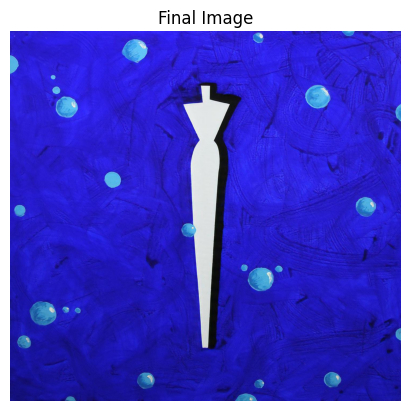

In [11]:
# Display final image
plt.imshow(images[0])
plt.axis("off")
plt.title("Final Image")
plt.show()

In [20]:
def find_optimal_k(image,image_num = None, max_k=10):
    image = np.array(image)
    if image.ndim == 2:
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    if image.shape[-1] == 4:
        image = cv2.cvtColor(image, cv2.COLOR_RGBA2BGR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    pixels = image.reshape(-1, 3)

    inertias = []
    ks = range(1, max_k + 1)

    for k in ks:
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
        kmeans.fit(pixels)
        inertias.append(kmeans.inertia_)

    plt.figure(figsize=(8, 5))
    plt.plot(ks, inertias, marker='o', linestyle='--')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Inertia')
    plt.title(f'Elbow Method for Optimal K at {image_num}')
    plt.show()

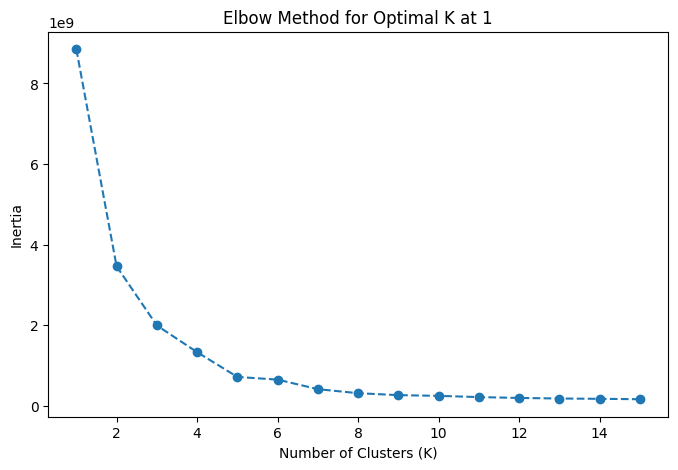

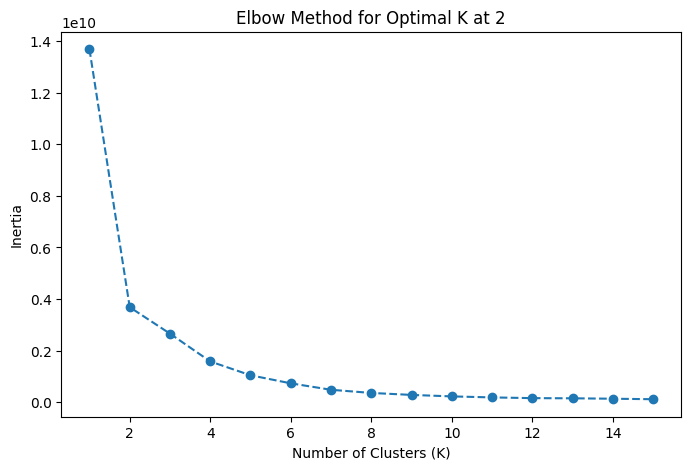

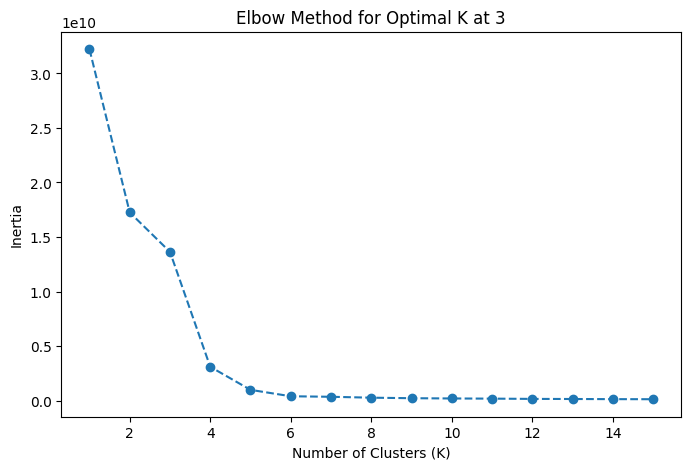

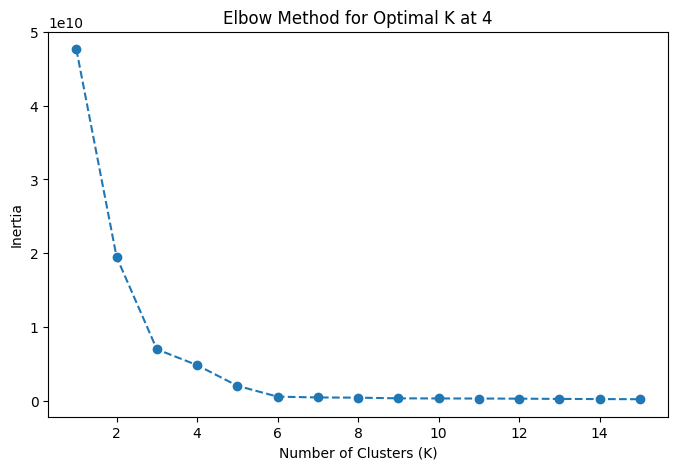

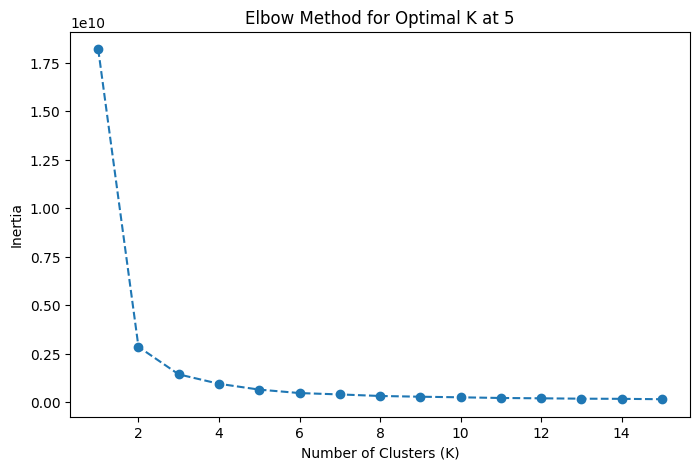

...

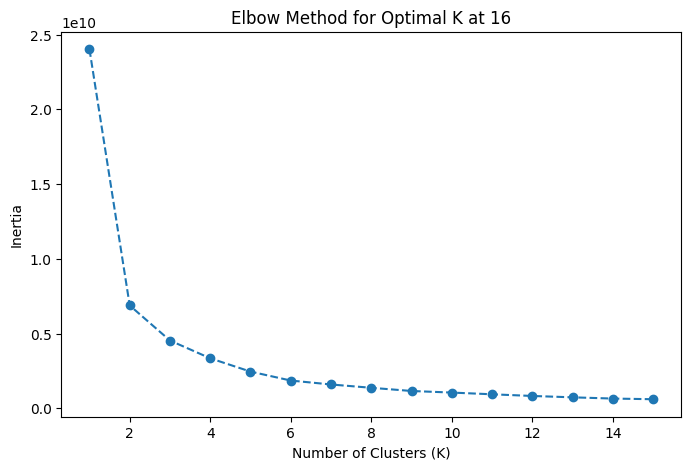

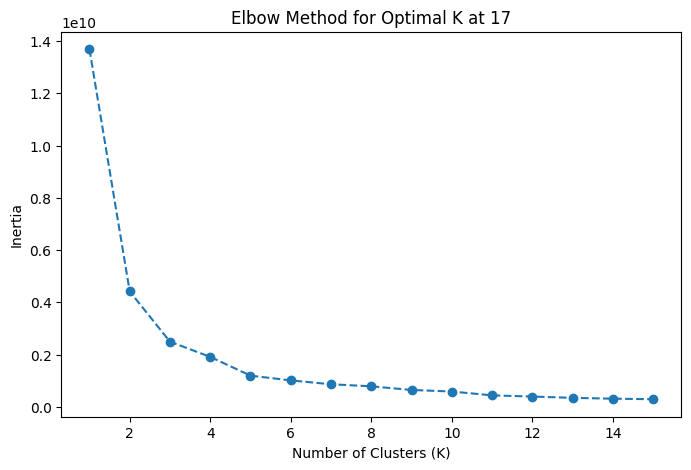

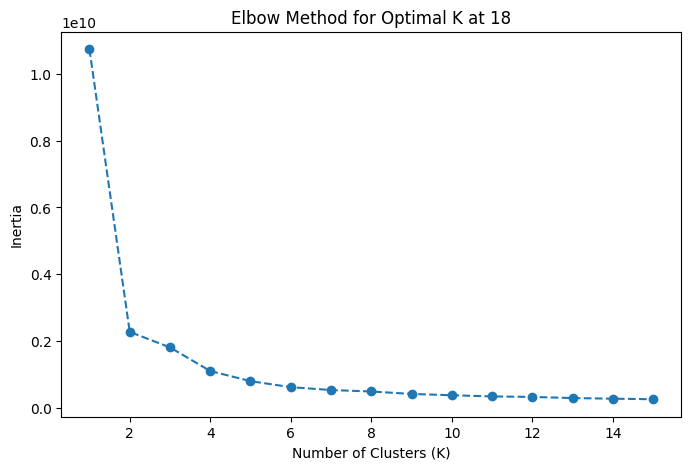

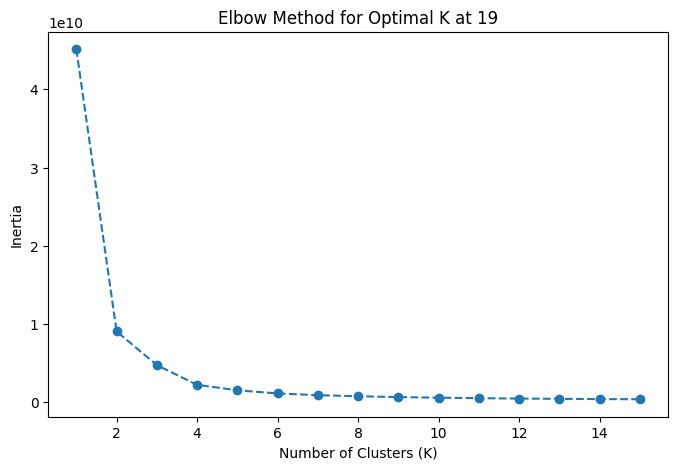

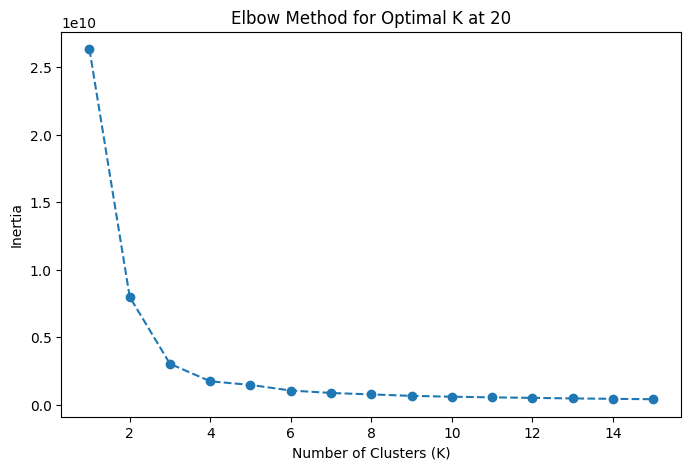

In [21]:
count = 0
for img in images:
  count = count + 1
  find_optimal_k(img,image_num=count,max_k=15)

In [9]:
import numpy as np
import cv2
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

def compute_and_display_segments(image, k=5, color_space='RGB',image_number=None, initial_centroids=None, seg_return = False):
    # Convert PIL.Image.Image to NumPy array (OpenCV uses BGR format by default)
    image = np.array(image)
    if image.ndim == 2:  # Handle grayscale images
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

    # Ensure the image is in BGR format for OpenCV processing
    if image.shape[-1] == 4:  # Handle RGBA images
        image = cv2.cvtColor(image, cv2.COLOR_RGBA2BGR)
    elif image.shape[-1] == 3 and color_space == 'RGB':
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # Convert to specified color space
    if color_space == 'HSV':
        image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    elif color_space == 'Lab':
        image = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)
    else:  # Default to RGB
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Reshape image into 2D array of pixels
    pixels = image.reshape(-1, 3)

    # Apply K-Means clustering
    if initial_centroids is not None:
        kmeans = KMeans(n_clusters=k, init=np.array(initial_centroids), n_init=1, random_state=42)
    else:
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)

    kmeans.fit(pixels)

    # Get cluster labels and dominant colors
    labels = kmeans.labels_
    dominant_colors = kmeans.cluster_centers_

    # Create segmented images for each cluster
    segmented_images = []
    for cluster_idx in range(k):
        # Create a mask for the current cluster
        mask = (labels == cluster_idx)

        # Initialize a black image
        cluster_image = np.zeros_like(pixels, dtype=np.uint8)

        # Set pixels belonging to the cluster to their original color
        cluster_image[mask] = pixels[mask]

        # Reshape to original dimensions
        cluster_image = cluster_image.reshape(image.shape)
        segmented_images.append(cluster_image)

    # Plot the original image and each segment
    plt.figure(figsize=(15, 8))
    plt.subplot(2, (k + 1) // 2 + 1, 1)
    plt.title(f"Original Image {image_number}")
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) #remove , cv2.COLOR_BGR2RGB and check
    plt.axis("off")

    for i, segmented in enumerate(segmented_images, start=2):
        plt.subplot(2, (k + 1) // 2 + 1, i)
        plt.title(f"Segment {i - 1}")
        plt.imshow(cv2.cvtColor(segmented, cv2.COLOR_BGR2RGB))
        plt.axis("off")

    plt.tight_layout()
    # Get dominant colors and proportions
    dominant_colors = kmeans.cluster_centers_
    proportions = np.bincount(kmeans.labels_) / len(kmeans.labels_)

    if seg_return == True:
      return dominant_colors, proportions, segmented_images
    else:
       return dominant_colors, proportions,


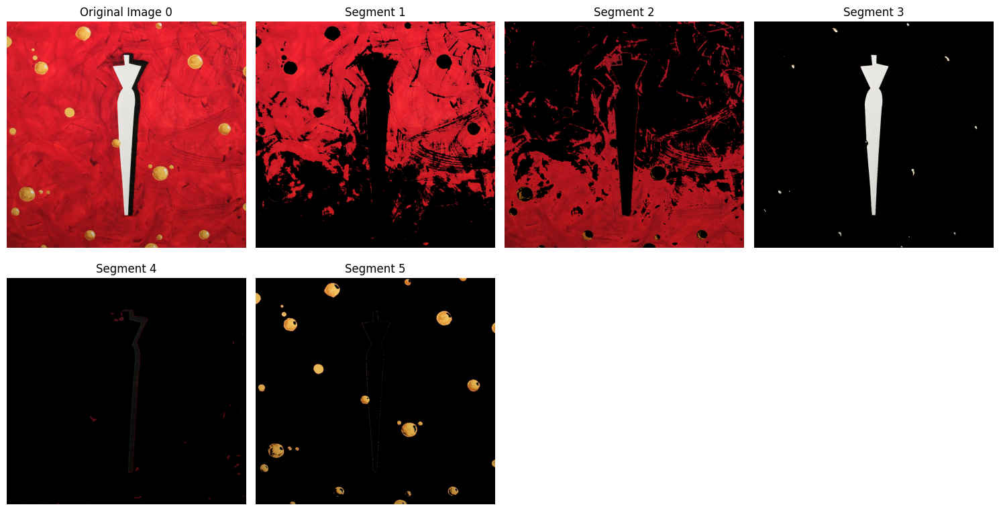

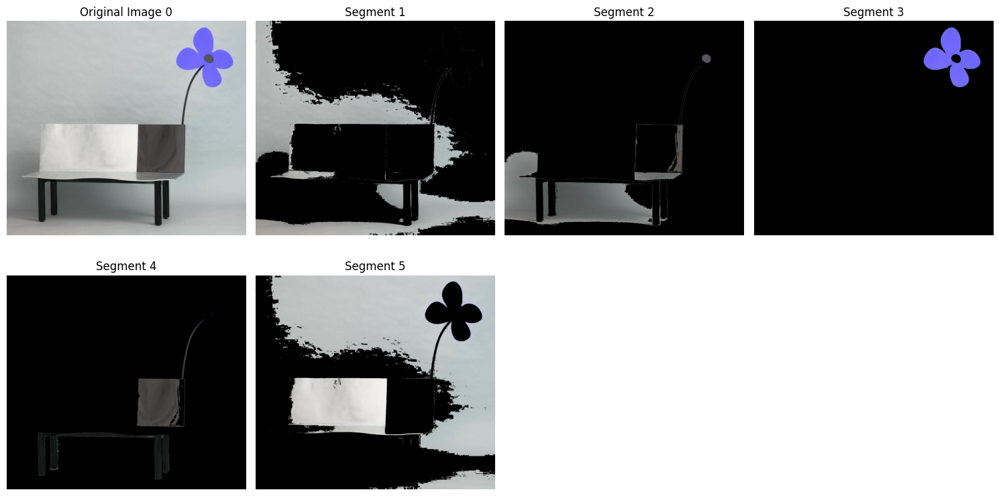

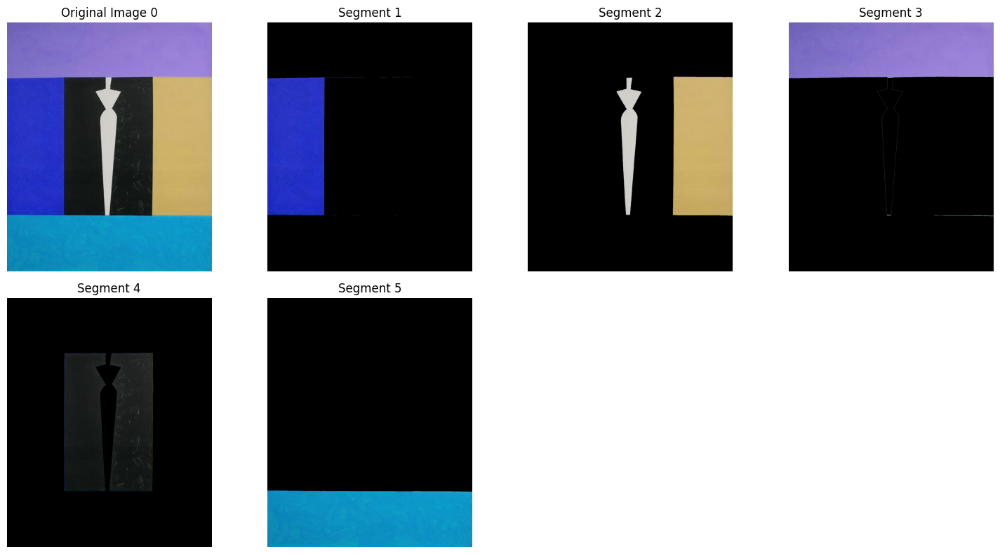

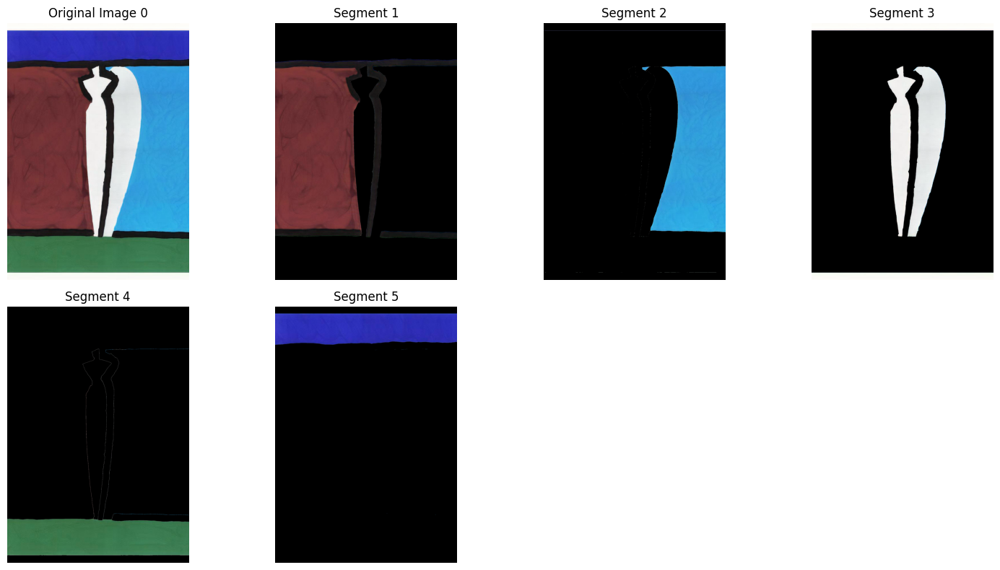

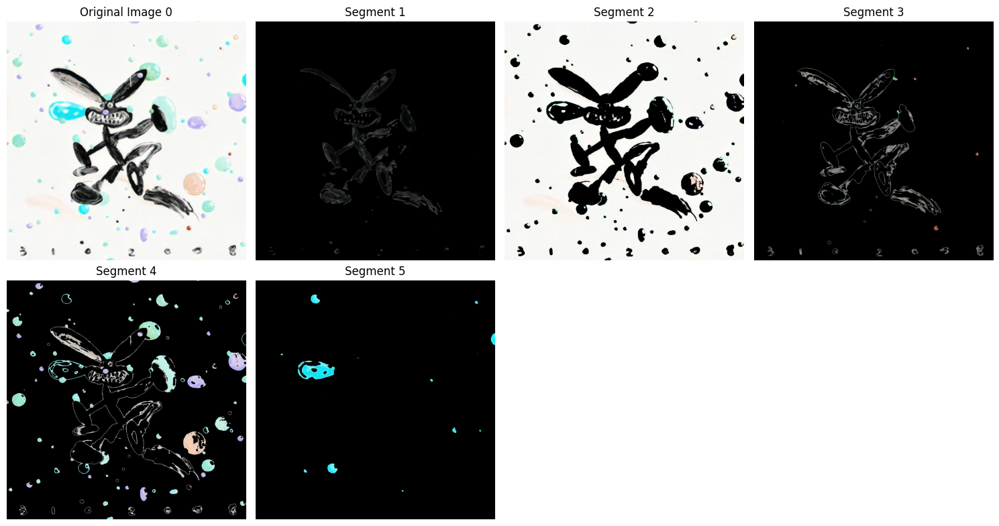

...

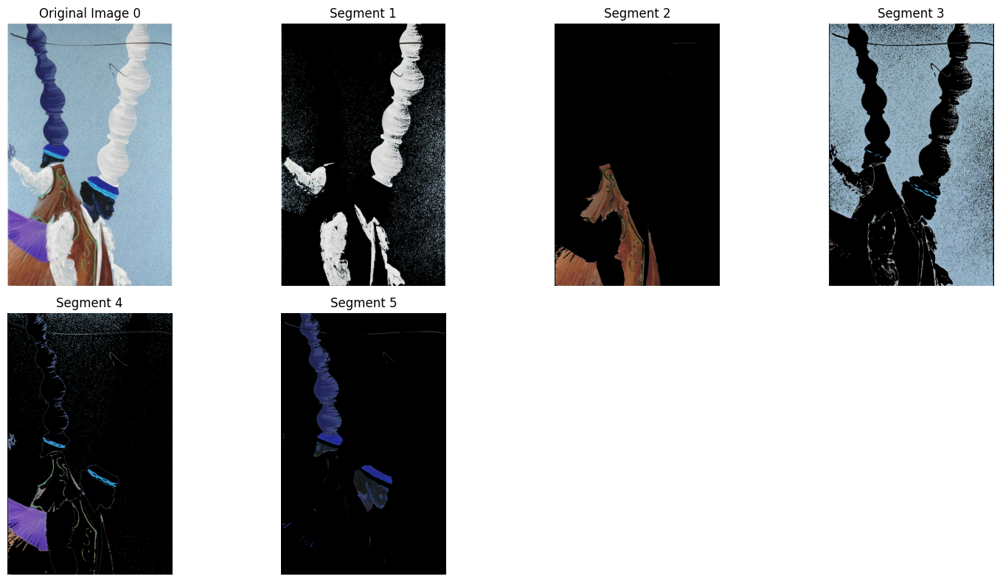

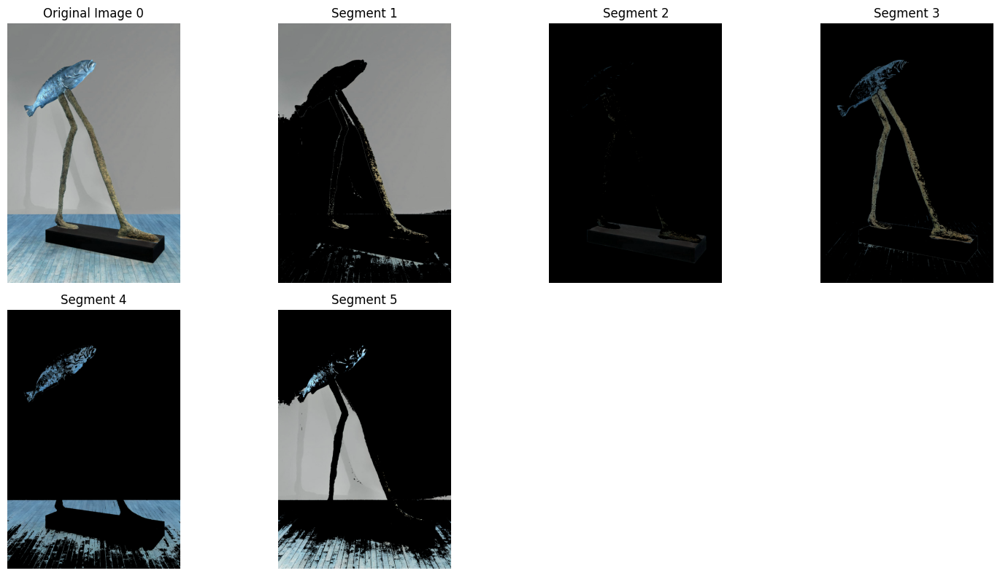

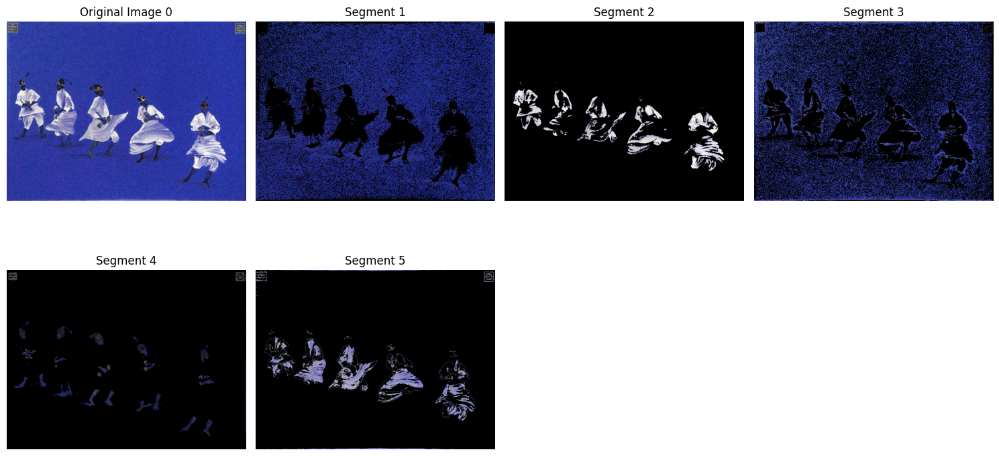

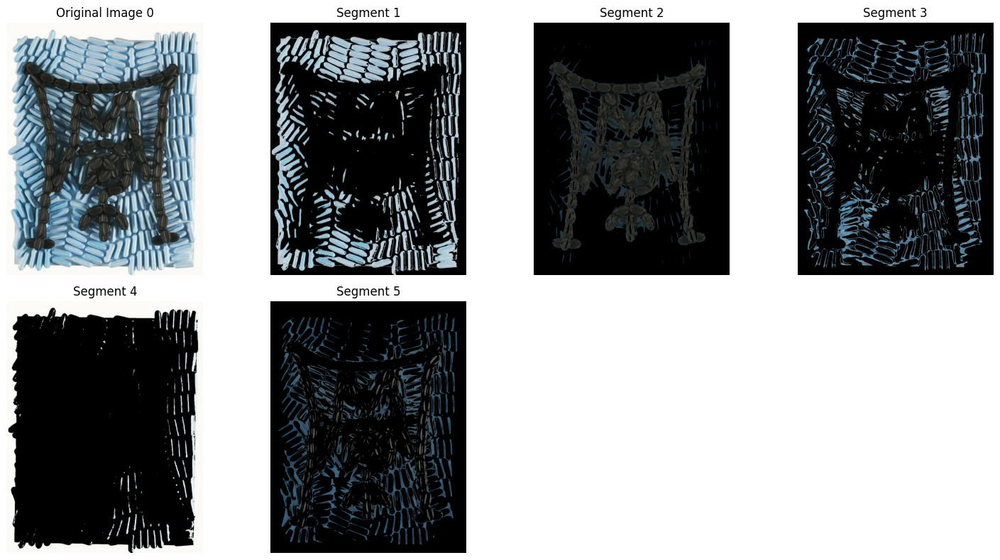

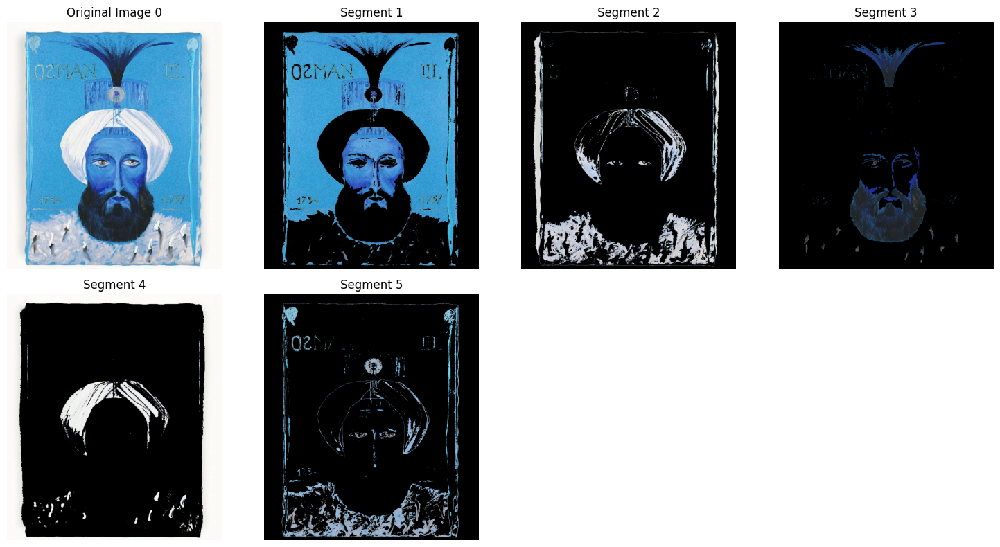

In [18]:
metrick12 = []
count = 0
for img in images:
  if count==0:
        metrick12.append(compute_and_display_segments(img, k=5,image_number = count,seg_return=True))
        count = count + 1

In [12]:
def combine_segments(segmented_images, k):
    combined_image = np.zeros_like(segmented_images[0], dtype=np.uint8)
    for segment in segmented_images:
        combined_image += segment #// k
    return combined_image

In [14]:
com_img = combine_segments(metrick12[0][2],k=12)

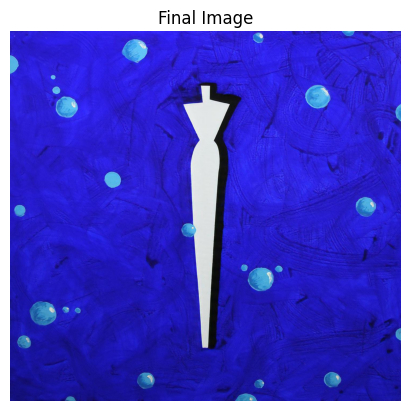

In [15]:
plt.imshow(com_img)
plt.axis("off")
plt.title("Final Image")
plt.show()